In [447]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import csv
import pandas as pd

def crop(image):
  x = 105
  y = 0
  width = 135
  height = 300

  bottle = image[y:y+height, x:x+width]

  return bottle

In [448]:
def load_images_from_folder(folder_path):
    images = []
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path):
            image = cv2.imread(file_path)
            if image is not None:
                images.append(image)
    return images

In [449]:
import re
def natural_sort_key(s):
    return [int(x) if x.isdigit() else x for x in re.split(r'(\d+)', s)]

In [450]:
def content_high(image):
  x = 30
  y = 113
  width = 70
  height = 22

  content_region = image[y:y+height, x:x+width]

  lower_color = np.array([0, 0, 0])  
  upper_color = np.array([50, 50, 50])  

  mask = cv2.inRange(content_region, lower_color, upper_color)

  has_content = np.any(mask == 255)

  if has_content:
      return 1
  else:
      return 0

In [451]:
def content_low(image):
    x = 30
    y = 130  
    width = 70
    height = 22

    content_region = image[y:y+height, x:x+width]

    lower_color = np.array([0, 0, 0])  
    upper_color = np.array([60, 60, 60]) 

    mask = cv2.inRange(content_region, lower_color, upper_color)

    black_pixels = np.any(mask == 255)

    if black_pixels:
        return 0  
    else:
        return 1  

In [452]:
def bottle_none(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    x = int(image.shape[1] / 4)
    y = int(image.shape[0] / 4)
    width = int(image.shape[1] / 2)
    height = int(image.shape[0] / 2)
    central_region = gray[y:y+height, x:x+width]

    edges = cv2.Canny(central_region, 100, 200)

    has_edges = np.any(edges > 0)

    if not has_edges:
        return 1
    else:
        return 0

In [453]:
def cover_none(image):
  x = 0
  y = 0
  width = 100
  height = 70

  cap_region = image[y:y+height, x:x+width]

  lower_color = np.array([100, 0, 0]) 
  upper_color = np.array([255, 60, 60])
  
  mask = cv2.inRange(cap_region, lower_color, upper_color)

  red = np.any(mask == 255)

  if red:
      return 0
  else:
      return 1

In [454]:
def label_none(image):
    x = 20
    y = 175
    width = 150
    height = 150

    label_region = image[y:y+height, x:x+width]

    hsv_image = cv2.cvtColor(label_region, cv2.COLOR_BGR2HSV)

    lower_red = np.array([0, 100, 100])
    upper_red = np.array([10, 255, 255])

    mask1 = cv2.inRange(hsv_image, lower_red, upper_red)
    mask = cv2.bitwise_and(label_region,label_region,mask1)

    red = np.any(mask == 255)

    if red:
        return 0
    else:
        return 1


In [455]:
def label_white(image):
    x = 30
    y = 175
    width = 130
    height = 70

    label_region = image[y:y+height, x:x+width]

    gray_image = cv2.cvtColor(label_region, cv2.COLOR_RGB2GRAY)
    thresh = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
  
    total_pixels = np.prod(thresh.shape)
    white_pixels = np.sum(thresh == 255)
    white_percentage = (white_pixels / total_pixels) * 100

    has_significant_white_area = white_percentage > 75

    if has_significant_white_area:
        return 1
    else:
        return 0

In [456]:
def label_misplaced(image):
    x = 5
    y = 150
    width = 150
    height = 85

    label_region = image[y:y+height, x:x+width]
    label_region = cv2.GaussianBlur(label_region, (5, 5), 0)
    gray_image = cv2.cvtColor(label_region, cv2.COLOR_BGR2GRAY)

    equ = cv2.equalizeHist(gray_image)

    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(equ, cv2.MORPH_CLOSE, kernel)

    sobel_x = cv2.Sobel(closing, cv2.CV_16S, 1, 0)
    sobel_y = cv2.Sobel(closing, cv2.CV_16S, 0, 1)
    edges = cv2.Canny(sobel_x, sobel_y, 110, 255)
    
    # Detecção de linhas usando a transformada de Hough
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=45, minLineLength=55, maxLineGap=10)

    if lines is not None:
        # Verificar a inclinação das linhas
        is_misplaced = False
        for line in lines:
            x1, y1, x2, y2 = line[0]
            angle = np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi
            if np.abs(angle) > 5 and np.abs(angle) < 20:  
                is_misplaced = True
                break
        return int(is_misplaced)
    else:
        return 0

In [457]:
defects_dict = {
    "CONTENT_HIGH": 0,
    "CONTENT_LOW": 0,
    "COVER_NONE": 0,
    "BOTTLE_SMASHED": 0,
    "LABEL_WHITE": 0,
    "LABEL_MISPLACED": 0,
    "LABEL_NONE": 0,
    "BOTTLE_NONE": 0
}


In [458]:
def detect_defects(image_paths, defects_dict, output_csv_path):
    defect_labels = [
        "CONTENT_HIGH",
        "CONTENT_LOW",
        "COVER_NONE",
        "BOTTLE_SMASHED",
        "LABEL_WHITE",
        "LABEL_MISPLACED",
        "LABEL_NONE",
        "BOTTLE_NONE"
    ]

    with open(output_csv_path, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(["Imagem"] + defect_labels)  

        for image_path in image_paths:
            dic = defects_dict.copy()

            image = cv2.imread(image_path)
            img = crop(image)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img_original = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            dic["CONTENT_HIGH"] = content_high(img)
            dic["CONTENT_LOW"] = content_low(img)
            dic["COVER_NONE"] = cover_none(img)
            dic["LABEL_WHITE"] = label_white(img)
            dic["LABEL_MISPLACED"] = label_misplaced(img)
            dic["LABEL_NONE"] = label_none(img)
            dic["BOTTLE_NONE"] = bottle_none(img)

            if dic["BOTTLE_NONE"] == 1:
                dic["CONTENT_HIGH"] = 0
                dic["CONTENT_LOW"] = 0
                dic["COVER_NONE"] = 0
                dic["LABEL_WHITE"] = 0
                dic["LABEL_MISPLACED"] = 0
                dic["LABEL_NONE"] = 0
                dic["BOTTLE_NONE"] = 1

            file_name = os.path.basename(image_path)  
            writer.writerow([file_name] + [dic[label] for label in defect_labels])  
           
            dados_array = np.array(list(dic.values()))
            print(image_path)
            print(dados_array)
            # MOSTRAR AS IMAGENS
            resized_img = cv2.resize(img_original, (500, 500))
            plt.figure(figsize=(5, 3))
            plt.imshow(resized_img)
            plt.show()


        

bottles/train/train_1.jpg
[0 0 0 0 0 0 0 0]


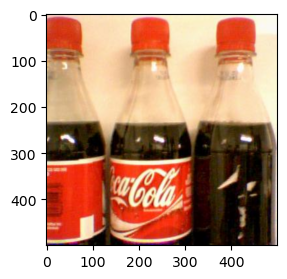

bottles/train/train_2.jpg
[0 0 0 0 0 0 0 0]


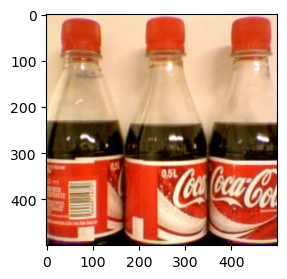

bottles/train/train_3.jpg
[1 0 1 0 0 1 0 0]


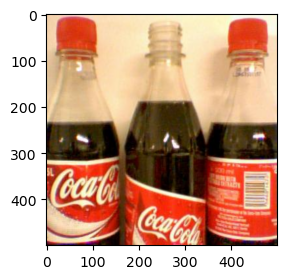

bottles/train/train_4.jpg
[1 0 1 0 0 0 0 0]


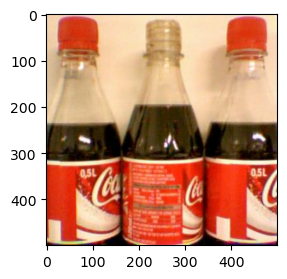

bottles/train/train_5.jpg
[1 0 1 0 0 0 0 0]


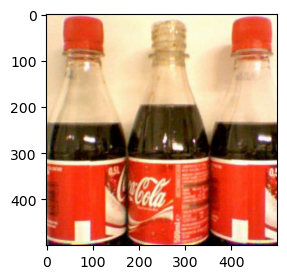

bottles/train/train_6.jpg
[1 0 1 0 0 0 0 0]


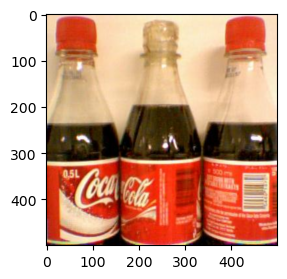

bottles/train/train_7.jpg
[0 0 0 0 0 0 0 0]


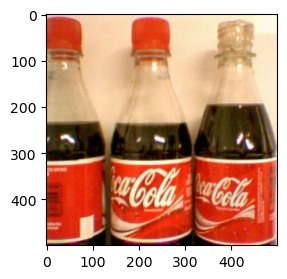

bottles/train/train_8.jpg
[0 0 0 0 0 0 0 0]


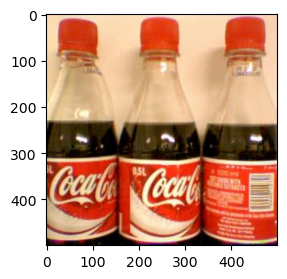

bottles/train/train_9.jpg
[0 0 0 0 0 0 0 1]


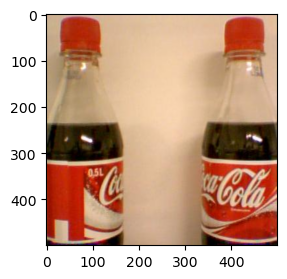

bottles/train/train_10.jpg
[1 0 0 0 0 1 0 0]


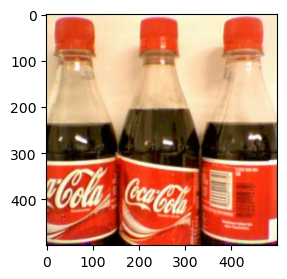

bottles/train/train_11.jpg
[0 0 0 0 0 0 0 0]


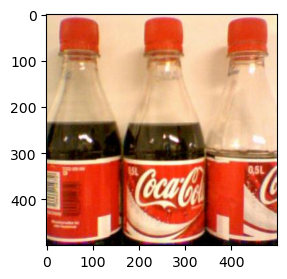

bottles/train/train_12.jpg
[1 0 1 0 0 0 0 0]


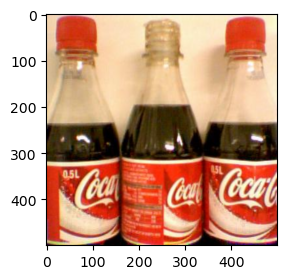

bottles/train/train_13.jpg
[0 0 0 0 0 0 0 1]


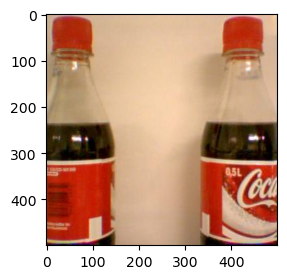

bottles/train/train_14.jpg
[0 0 0 0 0 0 1 0]


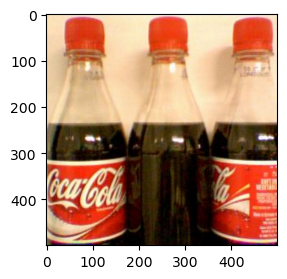

bottles/train/train_15.jpg
[0 0 0 0 0 0 0 0]


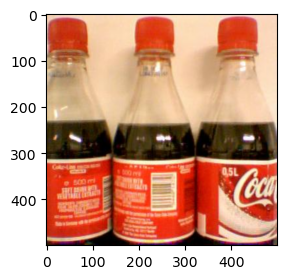

bottles/train/train_16.jpg
[0 0 0 0 1 0 0 0]


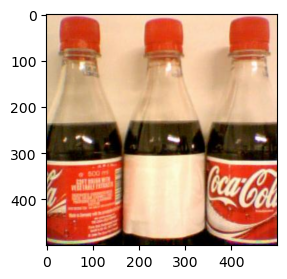

bottles/train/train_17.jpg
[0 1 1 0 0 0 0 0]


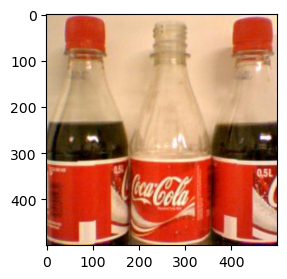

bottles/train/train_18.jpg
[1 0 0 0 0 0 0 0]


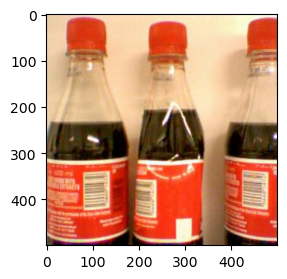

bottles/train/train_19.jpg
[1 0 0 0 0 1 0 0]


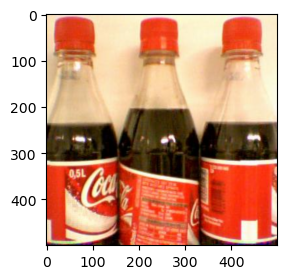

bottles/train/train_20.jpg
[0 0 0 0 0 0 0 0]


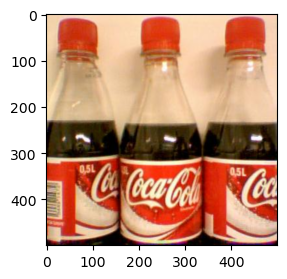

bottles/train/train_21.jpg
[1 0 0 0 0 0 0 0]


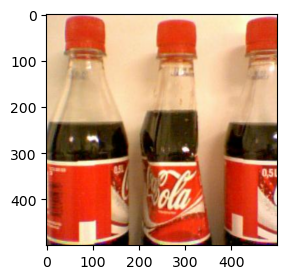

bottles/train/train_22.jpg
[0 1 0 0 0 0 0 0]


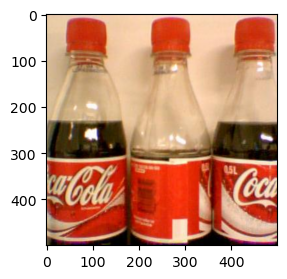

bottles/train/train_23.jpg
[1 0 1 0 0 0 1 0]


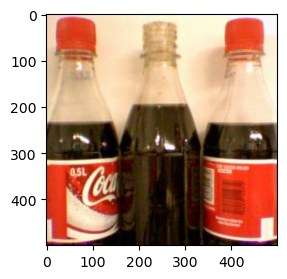

bottles/train/train_24.jpg
[1 0 0 0 0 0 0 0]


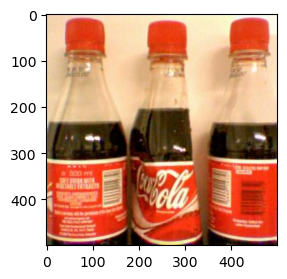

bottles/train/train_25.jpg
[0 0 0 0 0 0 0 0]


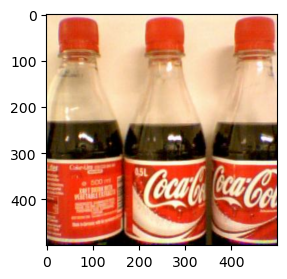

bottles/train/train_26.jpg
[0 0 0 0 0 0 0 0]


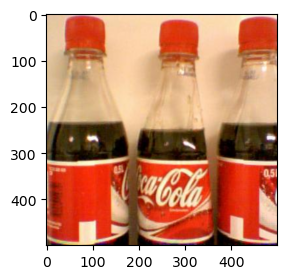

bottles/train/train_27.jpg
[1 0 1 0 0 0 0 0]


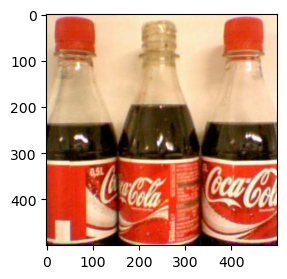

bottles/train/train_28.jpg
[0 0 0 0 0 0 0 0]


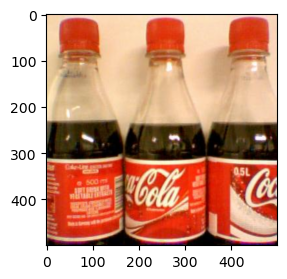

bottles/train/train_29.jpg
[0 0 0 0 0 0 0 0]


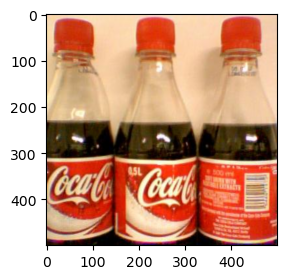

bottles/train/train_30.jpg
[0 0 0 0 0 0 0 0]


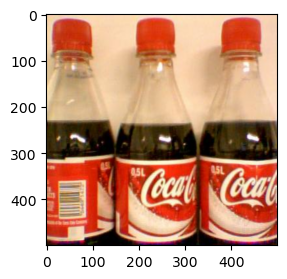

bottles/train/train_31.jpg
[0 0 0 0 0 0 0 0]


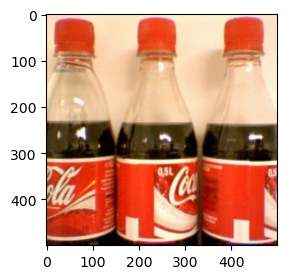

bottles/train/train_32.jpg
[1 0 0 0 0 0 0 0]


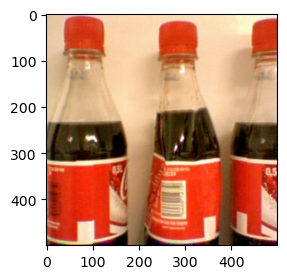

bottles/train/train_33.jpg
[1 0 0 0 0 1 0 0]


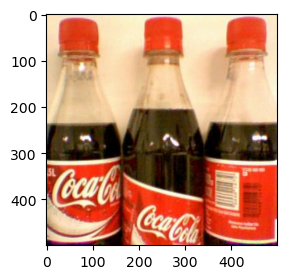

bottles/train/train_34.jpg
[1 0 0 0 0 0 0 0]


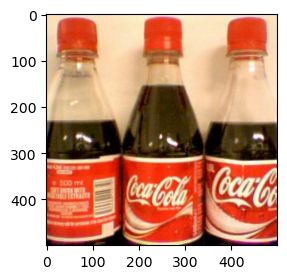

bottles/train/train_35.jpg
[0 0 0 0 0 0 0 0]


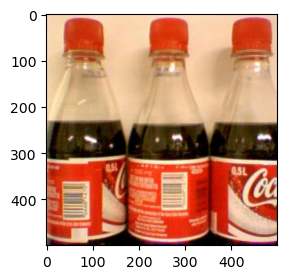

bottles/train/train_36.jpg
[0 0 0 0 0 0 1 0]


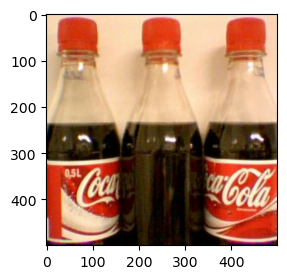

bottles/train/train_37.jpg
[0 0 0 0 0 0 0 1]


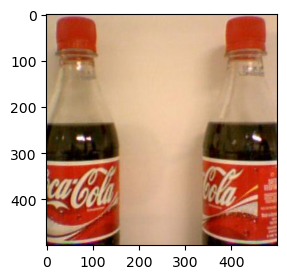

bottles/train/train_38.jpg
[0 0 0 0 0 0 0 0]


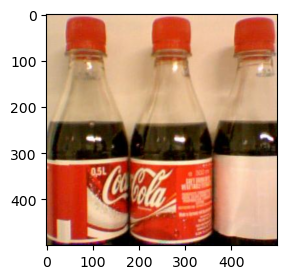

bottles/train/train_39.jpg
[0 0 0 0 0 0 0 0]


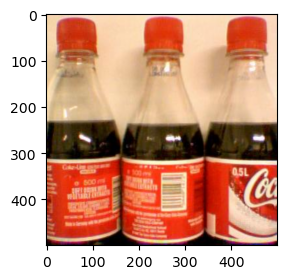

bottles/train/train_40.jpg
[0 0 0 0 1 0 0 0]


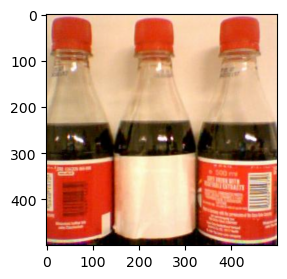

bottles/train/train_41.jpg
[0 0 0 0 0 0 0 0]


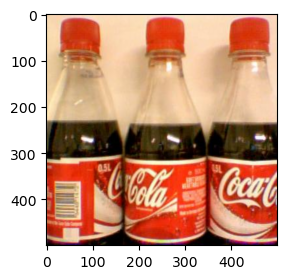

bottles/train/train_42.jpg
[1 0 1 0 0 0 0 0]


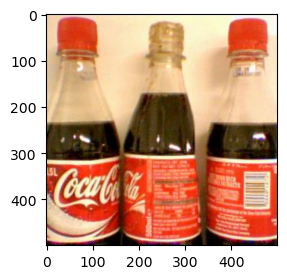

bottles/train/train_43.jpg
[0 0 0 0 0 0 0 0]


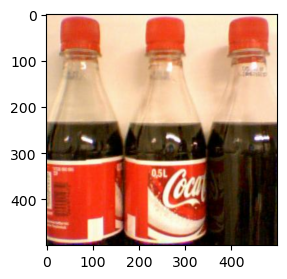

bottles/train/train_44.jpg
[0 1 0 0 0 0 0 0]


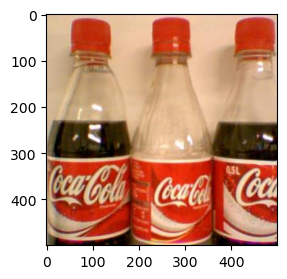

bottles/train/train_45.jpg
[0 0 0 0 1 0 0 0]


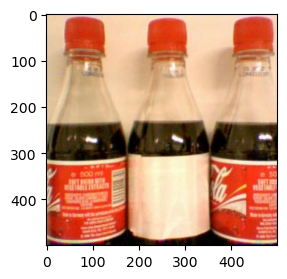

bottles/train/train_46.jpg
[0 1 0 0 0 0 0 0]


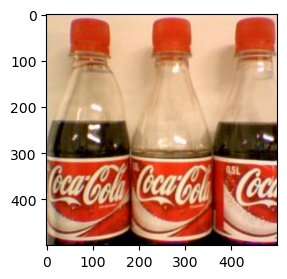

bottles/train/train_47.jpg
[1 0 0 0 0 1 0 0]


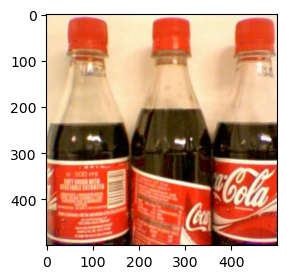

bottles/train/train_48.jpg
[0 0 0 0 0 0 0 0]


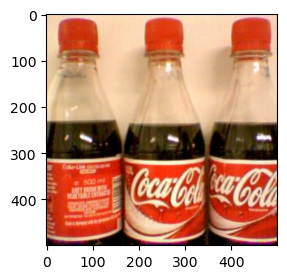

bottles/train/train_49.jpg
[0 1 0 0 0 0 0 0]


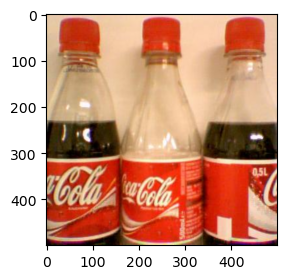

bottles/train/train_50.jpg
[0 1 0 0 0 0 0 0]


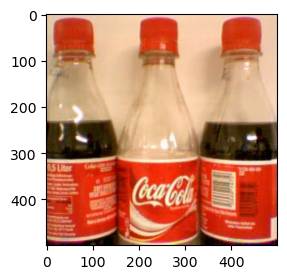

bottles/train/train_51.jpg
[1 0 0 0 0 1 0 0]


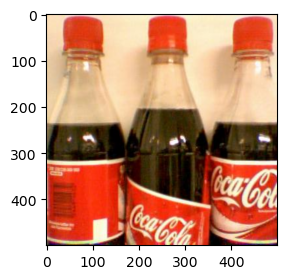

bottles/train/train_52.jpg
[0 1 0 0 0 0 0 0]


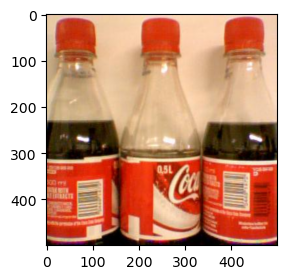

bottles/train/train_53.jpg
[1 0 0 0 0 1 0 0]


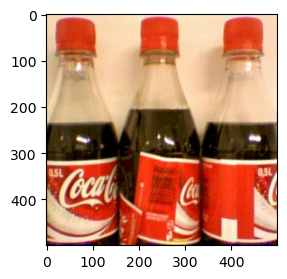

bottles/train/train_54.jpg
[0 0 0 0 0 0 1 0]


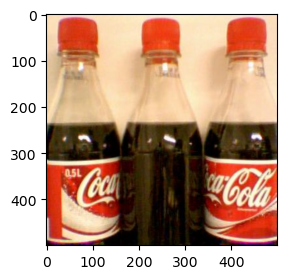

bottles/train/train_55.jpg
[0 1 0 0 1 0 0 0]


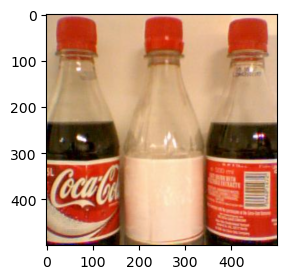

bottles/train/train_56.jpg
[0 0 0 0 1 0 0 0]


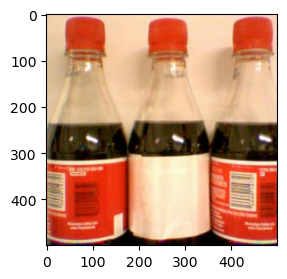

bottles/train/train_57.jpg
[1 0 0 0 0 0 0 0]


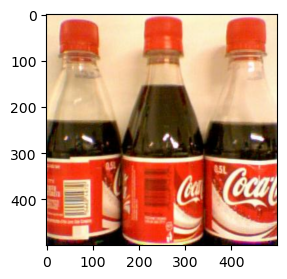

bottles/train/train_58.jpg
[0 0 0 0 0 0 0 0]


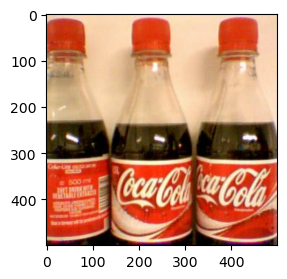

bottles/train/train_59.jpg
[0 0 0 0 0 0 0 1]


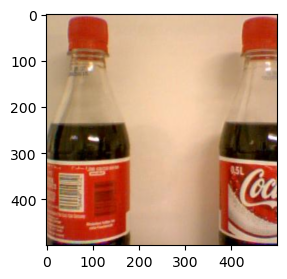

bottles/train/train_60.jpg
[0 0 0 0 0 0 1 0]


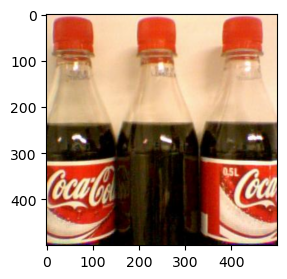

bottles/train/train_61.jpg
[0 0 0 0 0 0 0 0]


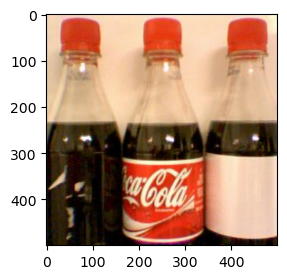

bottles/train/train_62.jpg
[0 0 0 0 0 0 0 0]


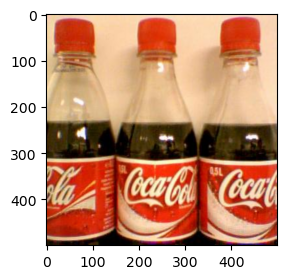

bottles/train/train_63.jpg
[0 0 0 0 1 0 0 0]


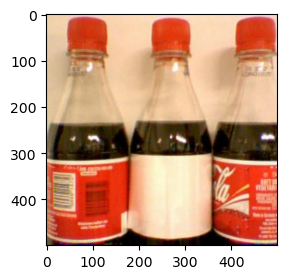

bottles/train/train_64.jpg
[0 0 0 0 0 0 0 0]


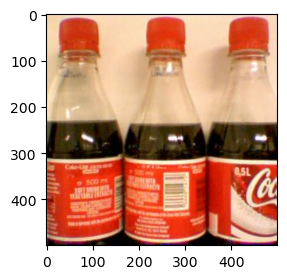

bottles/train/train_65.jpg
[0 0 0 0 0 0 0 1]


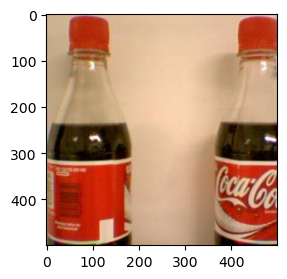

bottles/train/train_66.jpg
[0 0 0 0 0 0 0 1]


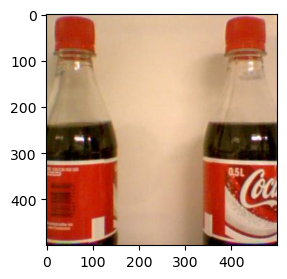

bottles/train/train_67.jpg
[1 0 0 0 1 0 0 0]


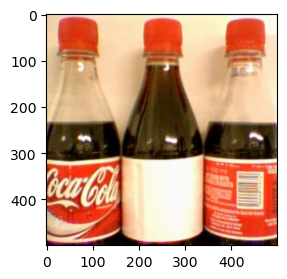

bottles/train/train_68.jpg
[0 0 0 0 0 0 1 0]


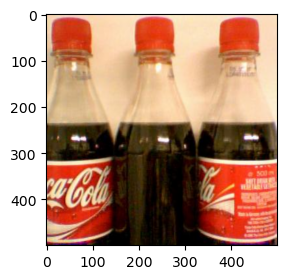

bottles/train/train_69.jpg
[1 0 0 0 0 0 0 0]


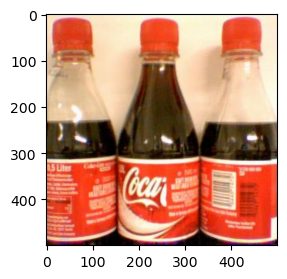

bottles/train/train_70.jpg
[1 0 0 0 0 0 0 0]


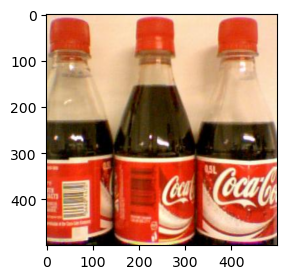

bottles/train/train_71.jpg
[0 0 0 0 0 0 0 0]


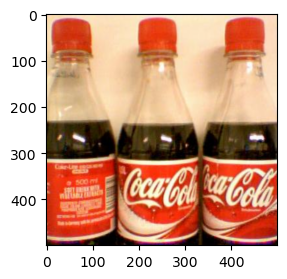

bottles/train/train_72.jpg
[0 0 0 0 0 0 0 0]


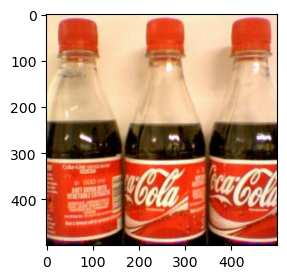

bottles/train/train_73.jpg
[0 0 0 0 0 0 0 0]


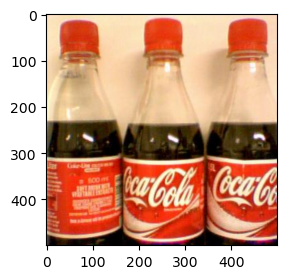

bottles/train/train_74.jpg
[0 0 0 0 0 0 0 0]


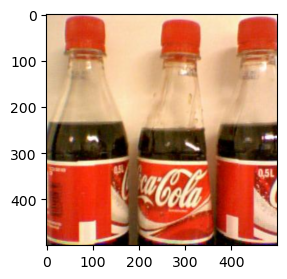

bottles/train/train_75.jpg
[1 0 0 0 0 0 0 0]


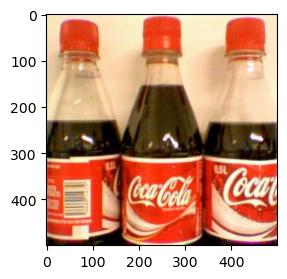

bottles/train/train_76.jpg
[1 0 0 0 0 1 0 0]


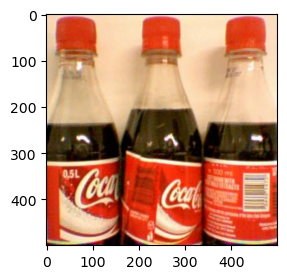

bottles/train/train_77.jpg
[0 0 0 0 0 0 0 0]


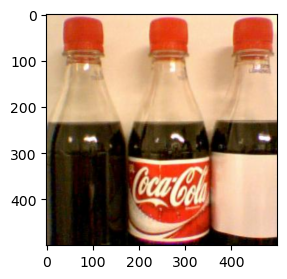

In [459]:
folder_path = 'bottles/train/'
output_csv_path = 'bottles/defects.csv'
image_files = sorted(os.listdir(folder_path),key=natural_sort_key)
image_paths = [os.path.join(folder_path, filename) for filename in image_files]

detect_defects(image_paths, defects_dict, output_csv_path)


In [460]:
# dados = pd.read_csv('bottles/defects.csv')
# print('---------------Dados gravado no CSV-------------')
# print(dados)